In [76]:
import sqlite3
import pandas as pd
import numpy as np
import seaborn as sns
import itertools
import matplotlib.pyplot as plt
import pandas_profiling
from tqdm.auto import tqdm
from datetime import datetime
import xml.etree.ElementTree as ET

In [4]:
with sqlite3.connect('data/database.sqlite') as con:
    matches = pd.read_sql_query("SELECT * from Match", con)
    leagues = pd.read_sql_query("SELECT * from League", con)
    teams = pd.read_sql_query("SELECT * from Team", con)
    player = pd.read_sql_query("SELECT * from Player",con)
    player_attributes = pd.read_sql_query("SELECT * from Player_Attributes",con)
    sequence = pd.read_sql_query("SELECT * from sqlite_sequence",con)
    team_attributes = pd.read_sql_query("SELECT * from Team_Attributes",con)

In [8]:
matches.profile_report(style={'full_width':True})

In [64]:
team_identifiers = ["country_id", "league_id", "season", "stage", "date", "match_api_id", "home_team_api_id", 
        "away_team_api_id", "home_team_goal", "away_team_goal"
       ]

statistics_identifiers = ["goal", "shoton","shotoff","foulcommit","card","cross","corner","possession"]

#betting_odds =

In [ ]:
# Not to be used since it would be cheating.
def calculate_stats_both_teams(xml_document, home_team, away_team, card_type='y'):
    tree = ET.fromstring(xml_document)
    stat_home_team = 0
    stat_away_team = 0
    
    if tree.tag == 'card':
        for child in tree.iter('value'):
            try:
                if child.find('comment').text == card_type:
                    if int(child.find('team').text) == home_team:
                        stat_home_team += 1
                    else:
                        stat_away_team += 1
            except AttributeError:
                pass
                
        return stat_home_team, stat_away_team
    
    if tree.tag == 'possession':
        try:
            last_value = [child for child in tree.iter('value')][-1]
            return int(last_value.find('homepos').text), int(last_value.find('awaypos').text)
        except:
            return None, None
    
    for team in [int(stat.text) for stat in tree.findall('value/team')]:
        if team == home_team: 
            stat_home_team += 1
        else:
            stat_away_team += 1
    return stat_home_team, stat_away_team

In [230]:
def get_last_matches(matches, date, team, x = 10):
    team_matches = matches[(matches['home_team_api_id'] == team) | (matches['away_team_api_id'] == team)]
    return team_matches[team_matches.date < date].sort_values(by = 'date', ascending = False).iloc[0:x,:]

In [231]:
def get_last_matches_against_eachother(matches, date, home_team, away_team, x = 10):
    home_matches = matches[(matches['home_team_api_id'] == home_team) & (matches['away_team_api_id'] == away_team)]    
    away_matches = matches[(matches['home_team_api_id'] == away_team) & (matches['away_team_api_id'] == home_team)]  
    total_matches = pd.concat([home_matches, away_matches])
    try:    
        last_matches = total_matches[total_matches.date < date].sort_values(by = 'date', ascending = False).iloc[0:x,:]
    except:
        last_matches = total_matches[total_matches.date < date].sort_values(by = 'date', ascending = False).iloc[0:total_matches.shape[0],:]
        if(last_matches.shape[0] > x):
            print("Error in obtaining matches")
    return last_matches

In [232]:
def get_goals_against(matches, team):
    home_goals = int(matches.home_team_goal[matches.away_team_api_id == team].sum())
    away_goals = int(matches.away_team_goal[matches.home_team_api_id == team].sum())
    return home_goals + away_goals

In [233]:
def get_goals(matches, team):
    home_goals = int(matches.home_team_goal[matches.home_team_api_id == team].sum())
    away_goals = int(matches.away_team_goal[matches.away_team_api_id == team].sum())
    return home_goals + away_goals

In [234]:
def get_wins(matches, team):
    home_wins = int(matches.home_team_goal[(matches.home_team_api_id == team) & (matches.home_team_goal > matches.away_team_goal)].count())
    away_wins = int(matches.away_team_goal[(matches.away_team_api_id == team) & (matches.away_team_goal > matches.home_team_goal)].count())
    return home_wins + away_wins 

In [236]:
def generate_match_features(match, matches, x = 10):
    date = match.date
    home_team = match.home_team_api_id
    away_team = match.away_team_api_id

    matches_home_team = get_last_matches(matches, date, home_team, x = 10)
    matches_away_team = get_last_matches(matches, date, away_team, x = 10)

    last_matches_against = get_last_matches_against_eachother(matches, date, home_team, away_team, x = 3)

    home_goals = get_goals(matches_home_team, home_team)
    away_goals = get_goals(matches_away_team, away_team)
    home_goals_against = get_goals_against(matches_home_team, home_team)
    away_goals_against = get_goals_against(matches_away_team, away_team)

    result = pd.DataFrame()

    result.loc[0, 'match_api_id'] = match.match_api_id
    result.loc[0, 'league_id'] = match.league_id

    result.loc[0, 'home_team_goals_difference'] = home_goals - home_goals_against
    result.loc[0, 'away_team_goals_difference'] = away_goals - away_goals_against
    result.loc[0, 'games_won_home_team'] = get_wins(matches_home_team, home_team) 
    result.loc[0, 'games_won_away_team'] = get_wins(matches_away_team, away_team)
    result.loc[0, 'games_against_won'] = get_wins(last_matches_against, home_team)
    result.loc[0, 'games_against_lost'] = get_wins(last_matches_against, away_team)

    return result.loc[0]

In [65]:
dropped_matches_wo_statistics = matches.dropna(subset=team_identifiers)
dropped_matches_w_statistics = matches.dropna(subset=statistics_identifiers)

#print(dropped_matches_wo_statistics.describe())
#print(dropped_matches_w_statistics.describe())

In [113]:
matches_w_statistics = dropped_matches_w_statistics[team_identifiers + statistics_identifiers]
matches_wo_statistics = dropped_matches_wo_statistics[team_identifiers]
matches_wo_statistics["date"] = matches_wo_statistics.agg(
            lambda x: datetime.strptime(x["date"], "%Y-%m-%d %H:%M:%S"), axis = 1)

In [237]:
temp_df = matches_wo_statistics.apply(lambda x : generate_match_features(x, matches_wo_statistics), axis=1)

In [249]:
matches_wo_statistics = pd.merge(matches_wo_statistics, hebe, how="left", on="match_api_id", suffixes=("", "_delete")).drop("league_id_delete", axis = 1)

In [38]:
fifa_df = pd.read_json("sofifa.jl", lines=True)
fifa_df.head()

,basic,build_up_play,chance_creation,date,defence,name,special
0,"[1896, 76, 77, 76, 76, €8.4M]","[Balanced, Normal, Mixed, Free Form]","[Lots, Normal, Normal, Organised]",2019-07-11,"[Double, High, Normal, Cover]",Sporting Braga,"[8, 3, 27, 25.55, 24.63]"
1,"[1896, 76, 77, 76, 76, €8.4M]","[Balanced, Normal, Mixed, Free Form]","[Lots, Normal, Normal, Organised]",2019-07-18,"[Double, High, Normal, Cover]",Sporting Braga,"[8, 3, 27, 25.55, 24.63]"
2,"[1837, 76, 80, 77, 75, €14M]","[Balanced, Normal, Mixed, Organised]","[Little, Safe, Little, Organised]",2019-06-03,"[Press, High, Normal, Offside Trap]",Sampdoria,"[5, 3, 25, 25.36, 25.32]"
3,"[1837, 76, 80, 77, 75, €14M]","[Balanced, Normal, Mixed, Organised]","[Little, Safe, Little, Organised]",2019-06-24,"[Press, High, Normal, Offside Trap]",Sampdoria,"[5, 3, 25, 25.36, 25.32]"
4,"[1837, 76, 80, 77, 75, €14M]","[Balanced, Normal, Mixed, Organised]","[Little, Safe, Little, Organised]",2019-07-11,"[Press, High, Normal, Offside Trap]",Sampdoria,"[5, 3, 24, 25.36, 25.50]"


In [42]:
expanded_fifa_df = pd.DataFrame(columns=["fifa_api_id","date", "OVA","ATT","MID","DEF","TransferBudget",
                                    "Speed","Dribbling","BuildPassing","BuildPositioning",
                                    "Crossing","ChancePassing","Shooting","ChancePositioning",
                                    "Aggression","Pressure","TeamWidth","DefenderLine",
                                    "DP","IP","SAA","TAA"])

expanded_fifa_df["fifa_api_id"] = pd.to_numeric(fifa_df.agg(lambda x:x[0][0], axis=1))
expanded_fifa_df["OVA"] = pd.to_numeric(fifa_df.agg(lambda x:x[0][1], axis=1))
expanded_fifa_df["ATT"] = pd.to_numeric(fifa_df.agg(lambda x:x[0][2], axis=1))
expanded_fifa_df["MID"] = pd.to_numeric(fifa_df.agg(lambda x:x[0][3], axis=1))
expanded_fifa_df["DEF"] = pd.to_numeric(fifa_df.agg(lambda x:x[0][4], axis=1))
expanded_fifa_df["TransferBudget"] = fifa_df.agg(lambda x:x[0][5], axis=1)
expanded_fifa_df["Speed"] = fifa_df.agg(lambda x:x[1][0], axis=1)
expanded_fifa_df["Dribbling"] = fifa_df.agg(lambda x:x[1][0], axis=1)
expanded_fifa_df["BuildPassing"] = fifa_df.agg(lambda x:x[1][0], axis=1)
expanded_fifa_df["BuildPositioning"] = fifa_df.agg(lambda x:x[1][0], axis=1)
expanded_fifa_df["Crossing"] = fifa_df.agg(lambda x:x[2][0], axis=1)
expanded_fifa_df["ChancePassing"] = fifa_df.agg(lambda x:x[2][0], axis=1)
expanded_fifa_df["Shooting"] = fifa_df.agg(lambda x:x[2][0], axis=1)
expanded_fifa_df["ChancePositioning"] = fifa_df.agg(lambda x:x[2][0], axis=1)
expanded_fifa_df["Aggression"] = fifa_df.agg(lambda x:x[4][0], axis=1)
expanded_fifa_df["Pressure"] = fifa_df.agg(lambda x:x[4][1], axis=1)
expanded_fifa_df["TeamWidth"] = fifa_df.agg(lambda x:x[4][2], axis=1)
expanded_fifa_df["DefenderLine"] = fifa_df.agg(lambda x:x[4][3], axis=1)
expanded_fifa_df["DP"] = pd.to_numeric(fifa_df.agg(lambda x:x[6][0], axis=1))
expanded_fifa_df["IP"] = pd.to_numeric(fifa_df.agg(lambda x:x[6][1], axis=1))
expanded_fifa_df["SAA"] = pd.to_numeric(fifa_df.agg(lambda x:x[6][2], axis=1))
expanded_fifa_df["TAA"] = pd.to_numeric(fifa_df.agg(lambda x:x[6][3], axis=1))
expanded_fifa_df["date"] = fifa_df["date"]

In [45]:
fifa_teams = pd.merge(expanded_fifa_df, teams, how="left", left_on="fifa_api_id", right_on="team_fifa_api_id")

In [250]:
df = pd.DataFrame()
dates = list(set(fifa_teams["date"].values))
dates.sort()
for i in tqdm(range(len(dates) - 1)):
    df = df.append(pd.merge(
                    matches_wo_statistics.loc[(matches_wo_statistics["date"] >= dates[i])
                            & (matches_wo_statistics["date"] <= dates[i + 1])],
                    fifa_teams.loc[fifa_teams["date"] == dates[i]], how = "left",
                    left_on="home_team_api_id", right_on="team_api_id"
                    )
                )
df = df.append(pd.merge(
        matches_wo_statistics.loc[(matches_wo_statistics["date"] >= dates[-1])],
        fifa_teams.loc[fifa_teams["date"] == dates[i]], how = "left",
        left_on="home_team_api_id", right_on="team_api_id"
    )
)

In [251]:
matches_wo_statistics["date"] = matches_wo_statistics.agg(
            lambda x: datetime.strptime(x["date"], "%Y-%m-%d %H:%M:%S"), axis = 1)

TypeError: ('strptime() argument 1 must be str, not Timestamp', 'occurred at index 0')

In [253]:
home_team_df = df

In [254]:
whole_df.columns

Index(['country_id', 'league_id', 'season', 'stage', 'date_x', 'match_api_id',
       'home_team_api_id', 'away_team_api_id', 'home_team_goal',
       'away_team_goal', 'home_team_goals_difference',
       'away_team_goals_difference', 'games_won_home_team',
       'games_won_away_team', 'games_against_won', 'games_against_lost',
       'date_y', 'OVA', 'ATT', 'MID', 'DEF', 'TransferBudget', 'Speed',
       'Dribbling', 'BuildPassing', 'BuildPositioning', 'Crossing',
       'ChancePassing', 'Shooting', 'ChancePositioning', 'Aggression',
       'Pressure', 'TeamWidth', 'DefenderLine', 'DP', 'IP', 'SAA', 'TAA',
       'team_api_id', 'team_fifa_api_id', 'team_long_name', 'team_short_name'],
      dtype='object')

In [255]:
df = pd.DataFrame()
dates = list(set(fifa_teams["date"].values))
dates.sort()
for i in tqdm(range(len(dates) - 1)):
    df = df.append(pd.merge(
                    home_team_df.loc[(home_team_df["date_x"] >= dates[i])
                            & (home_team_df["date_x"] <= dates[i + 1])],
                    fifa_teams.loc[fifa_teams["date"] == dates[i]], how = "left",
                    left_on="away_team_api_id", right_on="team_api_id", suffixes = ("_home", "_away")
                    )
                )
df = df.append(pd.merge(
        home_team_df.loc[(home_team_df["date_x"] >= dates[-1])],
        fifa_teams.loc[fifa_teams["date"] == dates[i]], how = "left",
        left_on="away_team_api_id", right_on="team_api_id", suffixes = ("_home", "_away")
    )
)
whole_df = df.dropna()

In [258]:
whole_df["win"] = whole_df.agg(lambda x: x["home_team_goal"] - x["away_team_goal"] > 0, axis = 1)
whole_df["draw"] = whole_df.agg(lambda x: x["home_team_goal"] - x["away_team_goal"] == 0, axis = 1)
whole_df["lose"] = whole_df.agg(lambda x: x["home_team_goal"] - x["away_team_goal"] < 0, axis = 1)
whole_df["outcome_of_match"] = whole_df.agg(lambda x: 1 if x["win"] else 0 if x["draw"] else -1, axis = 1)

In [262]:
import re
whole_df["TransferBudget_home"] = (whole_df["TransferBudget_home"].replace(r'[KM]+$', '', regex=True).astype(float) * \
                          whole_df["TransferBudget_home"].str.extract(r'[\d\.]+([KM]+)', expand=False)
                          .fillna(1).replace(['K','M'], [10**3, 10**6]).astype(int))
whole_df["TransferBudget_away"] = (whole_df["TransferBudget_away"].replace(r'[KM]+$', '', regex=True).astype(float) * \
                          whole_df["TransferBudget_away"].str.extract(r'[\d\.]+([KM]+)', expand=False)
                          .fillna(1).replace(['K','M'], [10**3, 10**6]).astype(int))

In [263]:
whole_df["ova_diff"] = whole_df.agg(lambda x: x["OVA_home"] - x["OVA_away"], axis = 1)
whole_df["att_diff"] = whole_df.agg(lambda x: x["ATT_home"] - x["ATT_away"], axis = 1)
whole_df["mid_diff"] = whole_df.agg(lambda x: x["MID_home"] - x["MID_away"], axis = 1)
whole_df["def_diff"] = whole_df.agg(lambda x: x["DEF_home"] - x["DEF_away"], axis = 1)

In [264]:
whole_df["goal_diff"] = whole_df.agg(lambda x: x["home_team_goal"] - x["away_team_goal"], axis = 1)

In [265]:
whole_df.drop(columns=["date_y", "date"], inplace=True)
whole_df.rename(columns={"date_x": "date"}, inplace=True)

In [261]:
whole_df = pd.read_csv("dataset.csv")

In [266]:
whole_df.to_csv("dataset.csv", index=False)

In [267]:
plot_df = whole_df[["ova_diff", "att_diff", "mid_diff", "def_diff", "goal_diff", 
                   "OVA_home", "ATT_home", "MID_home", "DEF_home", "home_team_goal", 
                   "OVA_away", "ATT_away", "MID_away", "DEF_away", "away_team_goal"]]

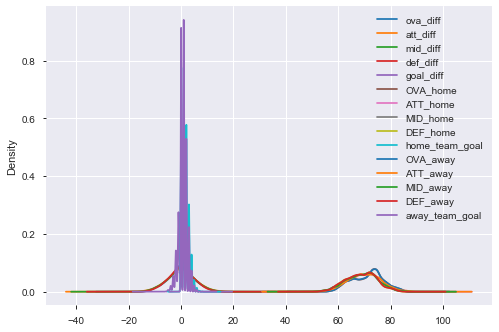

In [268]:
plot_df.plot.kde()

In [344]:
learning_df = whole_df.drop(columns=["date", "league_id", "season", "stage", "win", "draw", "lose", "league_id", "country_id",
                    'home_team_api_id', 'away_team_api_id', 'home_team_goal', 'away_team_goal',  'team_api_id_home', 'team_fifa_api_id_home', 'team_long_name_home',
                    'team_short_name_home', "match_api_id",
                'team_api_id_away', 'team_fifa_api_id_away', 'team_long_name_away', "goal_diff",
       'team_short_name_away'])

In [345]:
learning_df.columns

Index(['home_team_goals_difference', 'away_team_goals_difference',
       'games_won_home_team', 'games_won_away_team', 'games_against_won',
       'games_against_lost', 'OVA_home', 'ATT_home', 'MID_home', 'DEF_home',
       'TransferBudget_home', 'Speed_home', 'Dribbling_home',
       'BuildPassing_home', 'BuildPositioning_home', 'Crossing_home',
       'ChancePassing_home', 'Shooting_home', 'ChancePositioning_home',
       'Aggression_home', 'Pressure_home', 'TeamWidth_home',
       'DefenderLine_home', 'DP_home', 'IP_home', 'SAA_home', 'TAA_home',
       'OVA_away', 'ATT_away', 'MID_away', 'DEF_away', 'TransferBudget_away',
       'Speed_away', 'Dribbling_away', 'BuildPassing_away',
       'BuildPositioning_away', 'Crossing_away', 'ChancePassing_away',
       'Shooting_away', 'ChancePositioning_away', 'Aggression_away',
       'Pressure_away', 'TeamWidth_away', 'DefenderLine_away', 'DP_away',
       'IP_away', 'SAA_away', 'TAA_away', 'outcome_of_match', 'ova_diff',
       'att_diff'

In [671]:
X = learning_df.drop("outcome_of_match", axis = 1)
y = learning_df["outcome_of_match"].values

In [670]:
learning_df = pd.read_csv("learningset.csv")

In [546]:
def one_hot_dataframe(df, cols):
    for each in cols:
        dummies = pd.get_dummies(df[each], prefix=each, drop_first=False)
        df = df.drop(each, axis = 1)
        df = pd.concat([df, dummies], axis=1)
    return df

In [688]:
encoded_X = one_hot_dataframe(X, ['Speed_home', 'Dribbling_home', 'BuildPassing_home',
       'BuildPositioning_home', 'Crossing_home', 'ChancePassing_home',
       'Shooting_home', 'ChancePositioning_home', 'Aggression_home',
       'Pressure_home', 'TeamWidth_home', 'DefenderLine_home', 'DP_home',
       'IP_home', 'SAA_home', 'TAA_home', 'Speed_away', 'Dribbling_away',
       'BuildPassing_away', 'BuildPositioning_away', 'Crossing_away',
       'ChancePassing_away', 'Shooting_away', 'ChancePositioning_away',
       'Aggression_away', 'Pressure_away', 'TeamWidth_away',
       'DefenderLine_away', 'DP_away', 'IP_away', 'SAA_away', 'TAA_away'])

In [746]:
encoded_X = X[list(important_features)]

In [541]:
#encoded_X = one_hot_dataframe(encoded_X, [])

In [690]:
len(encoded_X.columns)

28

In [673]:
encoded_X.columns

Index(['home_team_goals_difference', 'away_team_goals_difference',
       'games_won_home_team', 'games_won_away_team', 'games_against_won',
       'games_against_lost', 'OVA_home', 'ATT_home', 'MID_home', 'DEF_home',
       'TransferBudget_home', 'DP_home', 'IP_home', 'SAA_home', 'TAA_home',
       'OVA_away', 'ATT_away', 'MID_away', 'DEF_away', 'TransferBudget_away',
       'DP_away', 'IP_away', 'SAA_away', 'TAA_away', 'ova_diff', 'att_diff',
       'mid_diff', 'def_diff'],
      dtype='object')

In [740]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler, MinMaxScaler, LabelEncoder
#label_encoder = OneHotEncoder(categories = "auto", sparse=False)
#y = label_encoder.fit_transform(y.reshape(-1, 1))
label_encoder = LabelEncoder()
encoded_X = encoded_X.apply(LabelEncoder().fit_transform)

In [747]:
#scaler = MinMaxScaler(feature_range=(-1, 1))
scaler = StandardScaler()
scaled_X = scaler.fit_transform(encoded_X)

In [748]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(scaled_X, y, test_size = .2)

In [749]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators=50)
classifier.fit(X_train, y_train.astype(int))

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=50,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [750]:
from sklearn.metrics import accuracy_score
y_pred = classifier.predict(X_test)
print("Accuracy: {}".format(accuracy_score(y_pred, y_test)))

Accuracy: 0.600214938205266


In [755]:
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

<class 'numpy.ndarray'>


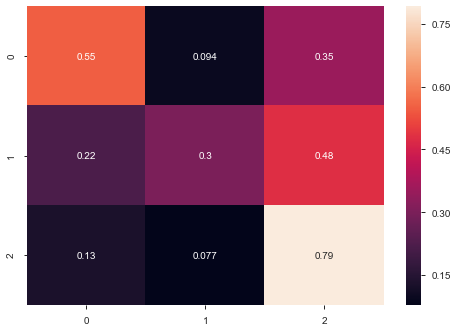

In [771]:
cm = confusion_matrix(y_pred=y_pred, y_true=y_test)
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm, annot=True)

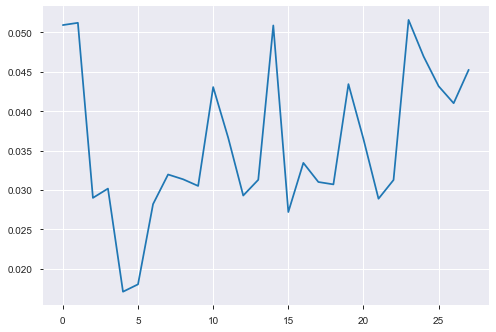

In [642]:
plt.plot(classifier.feature_importances_)

In [487]:
important_features = encoded_X.columns[(np.argwhere(classifier.feature_importances_ > .01) )]

In [488]:
important_features

Index(['home_team_goals_difference', 'away_team_goals_difference',
       'games_won_home_team', 'games_won_away_team', 'games_against_won',
       'games_against_lost', 'OVA_home', 'ATT_home', 'MID_home', 'DEF_home',
       'TransferBudget_home', 'DP_home', 'IP_home', 'SAA_home', 'TAA_home',
       'OVA_away', 'ATT_away', 'MID_away', 'DEF_away', 'TransferBudget_away',
       'DP_away', 'IP_away', 'SAA_away', 'TAA_away', 'ova_diff', 'att_diff',
       'mid_diff', 'def_diff'],
      dtype='object')

In [643]:
from xgboost import XGBClassifier
xgb = XGBClassifier(n_jobs=-1)
xgb.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0,
              learning_rate=0.1, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=-1,
              nthread=None, objective='multi:softprob', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
              silent=None, subsample=1, verbosity=1)

In [644]:
y_pred = xgb.predict(X_test)
print("Accuracy: {}".format(accuracy_score(y_pred, y_test)))

Accuracy: 0.5180010746910263


In [645]:
from sklearn.decomposition import PCA
pca = PCA(n_components=7)
reducted = pca.fit_transform(encoded_X)
print(pca.explained_variance_ratio_)

[0.58935003 0.22893972 0.07562046 0.04705422 0.0168957  0.01249087
 0.01010017]


In [560]:
xgb.fit(pca.transform(X_train), y_train)
y_pred = xgb.predict(pca.transform(X_test))
print("Accuracy: {}".format(accuracy_score(y_pred, y_test)))

Accuracy: 0.5371663979939101


In [646]:
classifier.fit(pca.transform(X_train), y_train.astype(int))
y_pred = classifier.predict(pca.transform(X_test))
print("Accuracy: {}".format(accuracy_score(y_pred, y_test)))

Accuracy: 0.5699444742969729


In [647]:
from sklearn.cluster import DBSCAN
outlier_detector = DBSCAN(eps = 15)
outliers = outlier_detector.fit_predict(pca.transform(scaled_X))

In [648]:
outlier_indices = np.argwhere(outliers<0)

In [649]:
for index in outlier_indices:
    if y[index] < 0:
        y[index] = -2
    elif y[index] > 0:
        y[index] = 2

In [661]:
X_train, X_test, y_train, y_test = train_test_split(pca.transform(scaled_X), big_y, test_size = .2, shuffle = False)
classifier = RandomForestClassifier(n_estimators=50)
classifier.fit((X_train), y_train.astype(int))
y_pred = classifier.predict((X_test))
print("Accuracy: {}".format(accuracy_score(y_pred, y_test)))

Accuracy: 0.48522299838796346


In [669]:
print("Accuracy: {}".format(accuracy_score(yyy , small_y_test)))

Accuracy: 0.48522299838796346


In [705]:
encoded_X.columns

Index(['home_team_goals_difference', 'away_team_goals_difference',
       'games_won_home_team', 'games_won_away_team', 'games_against_won',
       'games_against_lost', 'OVA_home', 'ATT_home', 'MID_home', 'DEF_home',
       'TransferBudget_home', 'DP_home', 'IP_home', 'SAA_home', 'TAA_home',
       'OVA_away', 'ATT_away', 'MID_away', 'DEF_away', 'TransferBudget_away',
       'DP_away', 'IP_away', 'SAA_away', 'TAA_away', 'ova_diff', 'att_diff',
       'mid_diff', 'def_diff'],
      dtype='object')

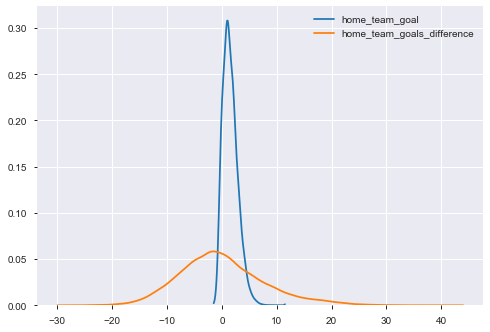

In [722]:
sns.kdeplot(whole_df["home_team_goal"], bw = .5)
sns.kdeplot(encoded_X["home_team_goals_difference"], bw = 1)

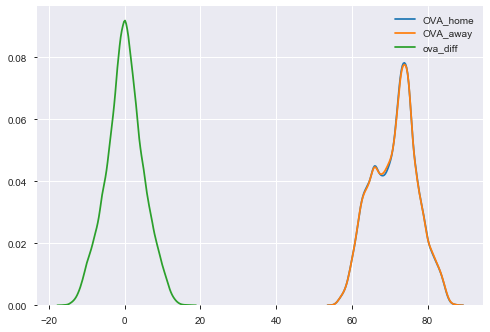

In [724]:
sns.kdeplot(whole_df.OVA_home)
sns.kdeplot(whole_df.OVA_away)
sns.kdeplot(encoded_X.ova_diff)